In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt 

#Reading the csv file for applications dataframe
applicationDF = pd.read_csv("/Users/lifesight/Desktop/EDA_Case Study/application_data.csv")

In [2]:
#Checking our important data like data types, rows and columns

print(applicationDF.shape)
print(applicationDF.head())
print(applicationDF.tail())
print(applicationDF.info(verbose = True, null_counts = False))

(307511, 122)
   SK_ID_CURR  TARGET NAME_CONTRACT_TYPE CODE_GENDER FLAG_OWN_CAR  \
0      100002       1         Cash loans           M            N   
1      100003       0         Cash loans           F            N   
2      100004       0    Revolving loans           M            Y   
3      100006       0         Cash loans           F            N   
4      100007       0         Cash loans           M            N   

  FLAG_OWN_REALTY  CNT_CHILDREN  AMT_INCOME_TOTAL  AMT_CREDIT  AMT_ANNUITY  \
0               Y             0          202500.0    406597.5      24700.5   
1               N             0          270000.0   1293502.5      35698.5   
2               Y             0           67500.0    135000.0       6750.0   
3               Y             0          135000.0    312682.5      29686.5   
4               Y             0          121500.0    513000.0      21865.5   

   ...  FLAG_DOCUMENT_18 FLAG_DOCUMENT_19 FLAG_DOCUMENT_20 FLAG_DOCUMENT_21  \
0  ...                 

In [3]:
#Finding the percentage of missing values:-
percent_missing = applicationDF.isnull().sum() * 100 / len(applicationDF)
missing_value_df = pd.DataFrame({'column_name': applicationDF.columns,
                                 'percent_missing': percent_missing})
missing_value_df.sort_values('percent_missing', inplace=True, ascending=False)
print(missing_value_df.head(60)) #Checking top 60 columns which has max missing values

                                               column_name  percent_missing
COMMONAREA_MEDI                            COMMONAREA_MEDI        69.872297
COMMONAREA_AVG                              COMMONAREA_AVG        69.872297
COMMONAREA_MODE                            COMMONAREA_MODE        69.872297
NONLIVINGAPARTMENTS_MODE          NONLIVINGAPARTMENTS_MODE        69.432963
NONLIVINGAPARTMENTS_AVG            NONLIVINGAPARTMENTS_AVG        69.432963
NONLIVINGAPARTMENTS_MEDI          NONLIVINGAPARTMENTS_MEDI        69.432963
FONDKAPREMONT_MODE                      FONDKAPREMONT_MODE        68.386172
LIVINGAPARTMENTS_MODE                LIVINGAPARTMENTS_MODE        68.354953
LIVINGAPARTMENTS_AVG                  LIVINGAPARTMENTS_AVG        68.354953
LIVINGAPARTMENTS_MEDI                LIVINGAPARTMENTS_MEDI        68.354953
FLOORSMIN_AVG                                FLOORSMIN_AVG        67.848630
FLOORSMIN_MODE                              FLOORSMIN_MODE        67.848630
FLOORSMIN_ME

In [4]:
#So from above missing value table we can see that approx 50 coulmns has missing values greater than 40%
#And all are related to building area, which is not relavent for our analysis so we can remove these columns.
applicationDF = applicationDF.loc[:, applicationDF.isnull().sum() * 100 / len(applicationDF) < 40]
print(applicationDF.columns) #Checking columns after removing columns with higher missing values

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH',
       'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'FLAG_MOBIL',
       'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE',
       'FLAG_EMAIL', 'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS',
       'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION',
       'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY',
       'ORGANIZATION_TYPE', 'EXT_SOURCE_2', 'EXT_SOURCE_3',
       'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_C

In [5]:
#Finding the percentage of missing values after removing the columns having more than 40% missing values
percent_missing = applicationDF.isnull().sum() * 100 / len(applicationDF)
missing_value_df = pd.DataFrame({'column_name': applicationDF.columns,
                                 'percent_missing': percent_missing})
missing_value_df.sort_values('percent_missing', inplace=True, ascending=False)
print(missing_value_df.head(60)) #Checking top 60 columns which has max missing values  

                                           column_name  percent_missing
OCCUPATION_TYPE                        OCCUPATION_TYPE        31.345545
EXT_SOURCE_3                              EXT_SOURCE_3        19.825307
AMT_REQ_CREDIT_BUREAU_YEAR  AMT_REQ_CREDIT_BUREAU_YEAR        13.501631
AMT_REQ_CREDIT_BUREAU_QRT    AMT_REQ_CREDIT_BUREAU_QRT        13.501631
AMT_REQ_CREDIT_BUREAU_MON    AMT_REQ_CREDIT_BUREAU_MON        13.501631
AMT_REQ_CREDIT_BUREAU_WEEK  AMT_REQ_CREDIT_BUREAU_WEEK        13.501631
AMT_REQ_CREDIT_BUREAU_DAY    AMT_REQ_CREDIT_BUREAU_DAY        13.501631
AMT_REQ_CREDIT_BUREAU_HOUR  AMT_REQ_CREDIT_BUREAU_HOUR        13.501631
NAME_TYPE_SUITE                        NAME_TYPE_SUITE         0.420148
OBS_30_CNT_SOCIAL_CIRCLE      OBS_30_CNT_SOCIAL_CIRCLE         0.332021
DEF_30_CNT_SOCIAL_CIRCLE      DEF_30_CNT_SOCIAL_CIRCLE         0.332021
OBS_60_CNT_SOCIAL_CIRCLE      OBS_60_CNT_SOCIAL_CIRCLE         0.332021
DEF_60_CNT_SOCIAL_CIRCLE      DEF_60_CNT_SOCIAL_CIRCLE         0

So from above percentage missing values we can see that below 5 columns which are having missing value greater than 0 and less than 1,so we will try to impute the missing value for the below columns-
NAME_TYPE_SUITE                        
AMT_GOODS_PRICE           
AMT_ANNUITY               
CNT_FAM_MEMBERS           
DAYS_LAST_PHONE_CHANGE    

In [6]:
#For 'NAME_TYPE_SUITE' we will see that 
#print(applicationDF['NAME_TYPE_SUITE'].unique())
print(applicationDF['NAME_TYPE_SUITE'].value_counts(normalize=True) * 100)

Unaccompanied      81.159562
Family             13.111205
Spouse, partner     3.713029
Children            1.066884
Other_B             0.578018
Other_A             0.282804
Group of people     0.088499
Name: NAME_TYPE_SUITE, dtype: float64


So, column NAME_TYPE_SUITE is a categorical columns which says with whom client has come to apply for loan and most of them are 'Unaccompanied' around 81% so we can replace missing value to 'Unaccompanied' and it makes more sense  
as compares to other values.

Next column is AMT_GOODS_PRICE, which has numerical values and shows the goods values for which loan has applied Which is directly related to the 'AMT_CREDIT', as how much money client requies he/she will gonna provide similar amount of goods to the company, So here we will create new dataframe with three columns('AMT_GOODS_PRICE','AMT_CREDIT ' and 'Difference_ammount'). And then will take mode of the difference and the mode can be imputed as missing values replacment.

In [7]:
dummy_df = applicationDF[['AMT_GOODS_PRICE','AMT_CREDIT']]
dummy_df['Difference_ammount'] = dummy_df['AMT_CREDIT'] - dummy_df['AMT_GOODS_PRICE']

print("Mode of the difference value is : ", dummy_df['Difference_ammount'].mode())

Mode of the difference value is :  0    0.0
dtype: float64


/Users/lifesight/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


So by the above analysis we can that mode of the difference comes out to be 0, that means for most of the 
clients loan ammount and goods values are same, so we can clearly replace missing value by relavent 'AMT_CREDIT' value.

In [8]:
#Next coulmn is 'AMT_ANNUITY' which is numerical value and it is not related to other column, like annuity 
#does not depend on other variable and it very from person to person  
print("Mean of the annuity : ", applicationDF['AMT_ANNUITY'].mean()) 
#So we can change the missing values to the mean value of the annuity, preferable to change after removing outlier

Mean of the annuity :  27108.573909183444


In [9]:
#Next Column is 'CNT_FAM_MEMBERS', which represent the count of family member and a numeric value, so will take mode 
#of the family member and it can be replace for the missing values considereing most of family has 2 member.
print("Median of the family member : ", applicationDF['CNT_FAM_MEMBERS'].median())
applicationDF['CNT_FAM_MEMBERS'].fillna(applicationDF['CNT_FAM_MEMBERS'].median(), inplace=True) 
#We will be using this column later so we are replacing missing values to mode of the column


Median of the family member :  2.0


In [10]:
#Next column is 'DAYS_LAST_PHONE_CHANGE', which represent days before when client changed his phone, So will 
#take average for the number days when client changes his phone and take is as our replacement for missing value
print("Mean of the days : ", applicationDF['DAYS_LAST_PHONE_CHANGE'].mean())
#preferable to change after removing outlier

Mean of the days :  -962.8587883320868


After handeling missing values (removing columns with more than 40% missing values and imputing the values which can be replaced for the missing values), We will remove some more columns which we are not considereing for our analysis.
Which are below.

In [11]:
#Remove columns which we are not considereing for our analysis and creating a new dataframe for that
#Removing the building related columns, as they are less useful to analyse for the loan approval
#that can be easily seen by columns having suffix as '_AVG', '_MODE' and '_MEDI' 
applicationDF = applicationDF[applicationDF.columns.drop(list(applicationDF.filter(regex='_AVG')))]
applicationDF = applicationDF[applicationDF.columns.drop(list(applicationDF.filter(regex='_MODE')))]
applicationDF = applicationDF[applicationDF.columns.drop(list(applicationDF.filter(regex='_MEDI')))]
#Remove the column whcih has data about social surroundings detials as we not considerening for our analysis
applicationDF = applicationDF[applicationDF.columns.drop(list(applicationDF.filter(regex='_CIRCLE')))]
#Remove the column which has flag for documents as documents is not requiremt at this point 
#and it is not mentioned that which document flag it is
applicationDF = applicationDF[applicationDF.columns.drop(list(applicationDF.filter(regex='FLAG_DOCUMENT')))]
#Remove the columns for client's contact to comapny as it will not gonna decide on our analysis
applicationDF = applicationDF[applicationDF.columns.drop(list(applicationDF.filter(regex='CREDIT_BUREAU')))]
#Removing external data as well as meta data is not defined clearly
applicationDF = applicationDF[applicationDF.columns.drop(list(applicationDF.filter(regex='EXT_SOURCE')))]
#Removing the region's flag and rating for the region as it is less relavent to our analysis
applicationDF = applicationDF[applicationDF.columns.drop(list(applicationDF.filter(regex='REGION')))]
#Removing the PROCESS_START as it is less relavent to our analysis
applicationDF = applicationDF[applicationDF.columns.drop(list(applicationDF.filter(regex='_PROCESS_START')))]
#Remove column with the client's accompany as it is less relavent to our analysis
applicationDF = applicationDF[applicationDF.columns.drop(list(applicationDF.filter(regex='NAME_TYPE_SUITE')))]
#Removing CITY_NOT_WORK column as it can't be decided for loan approval
applicationDF = applicationDF[applicationDF.columns.drop(list(applicationDF.filter(regex='CITY_NOT')))]
#Removing OWN_CAR_AGE column as it is less relavent to our analysis
applicationDF = applicationDF[applicationDF.columns.drop(list(applicationDF.filter(regex='OWN_CAR_AGE')))]
#Removing the coulmn related to phone details of home and work
applicationDF = applicationDF[applicationDF.columns.drop(list(applicationDF.filter(regex='_PHONE')))]

print(applicationDF.columns) #So now we have remaining columns for our analysis

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_INCOME_TYPE',
       'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
       'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH',
       'FLAG_MOBIL', 'FLAG_CONT_MOBILE', 'FLAG_EMAIL', 'OCCUPATION_TYPE',
       'CNT_FAM_MEMBERS', 'ORGANIZATION_TYPE'],
      dtype='object')


In [12]:
#Finding the percentage of missing values for the remaining columns
percent_missing = applicationDF.isnull().sum() * 100 / len(applicationDF)
missing_value_df = pd.DataFrame({'column_name': applicationDF.columns,
                                 'percent_missing': percent_missing})
missing_value_df.sort_values('percent_missing', inplace=True, ascending=False)
print(missing_value_df)  

                             column_name  percent_missing
OCCUPATION_TYPE          OCCUPATION_TYPE        31.345545
AMT_GOODS_PRICE          AMT_GOODS_PRICE         0.090403
AMT_ANNUITY                  AMT_ANNUITY         0.003902
SK_ID_CURR                    SK_ID_CURR         0.000000
NAME_HOUSING_TYPE      NAME_HOUSING_TYPE         0.000000
CNT_FAM_MEMBERS          CNT_FAM_MEMBERS         0.000000
FLAG_EMAIL                    FLAG_EMAIL         0.000000
FLAG_CONT_MOBILE        FLAG_CONT_MOBILE         0.000000
FLAG_MOBIL                    FLAG_MOBIL         0.000000
DAYS_ID_PUBLISH          DAYS_ID_PUBLISH         0.000000
DAYS_REGISTRATION      DAYS_REGISTRATION         0.000000
DAYS_EMPLOYED              DAYS_EMPLOYED         0.000000
DAYS_BIRTH                    DAYS_BIRTH         0.000000
NAME_EDUCATION_TYPE  NAME_EDUCATION_TYPE         0.000000
NAME_FAMILY_STATUS    NAME_FAMILY_STATUS         0.000000
TARGET                            TARGET         0.000000
NAME_INCOME_TY

Now data looks good for our analysis, Still we have few columns whose data type needs to be changed for analysis. Finding out these column name.

In [13]:
#Now checking datatype of our selected dataset, if we find any data type mismatch then we will change it 
print(applicationDF.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 25 columns):
SK_ID_CURR             307511 non-null int64
TARGET                 307511 non-null int64
NAME_CONTRACT_TYPE     307511 non-null object
CODE_GENDER            307511 non-null object
FLAG_OWN_CAR           307511 non-null object
FLAG_OWN_REALTY        307511 non-null object
CNT_CHILDREN           307511 non-null int64
AMT_INCOME_TOTAL       307511 non-null float64
AMT_CREDIT             307511 non-null float64
AMT_ANNUITY            307499 non-null float64
AMT_GOODS_PRICE        307233 non-null float64
NAME_INCOME_TYPE       307511 non-null object
NAME_EDUCATION_TYPE    307511 non-null object
NAME_FAMILY_STATUS     307511 non-null object
NAME_HOUSING_TYPE      307511 non-null object
DAYS_BIRTH             307511 non-null int64
DAYS_EMPLOYED          307511 non-null int64
DAYS_REGISTRATION      307511 non-null float64
DAYS_ID_PUBLISH        307511 non-null int64
FLAG_MOBIL      

In [14]:
#From above info we can see that 'FLAG_MOBIL' and 'FLAG_CONT_MOBILE' are integer but these are flag columns
# so it should be changed to object
#applicationDF['FLAG_MOBIL'].astype(object)
applicationDF['FLAG_MOBIL'] =  applicationDF.FLAG_MOBIL.astype(object)
applicationDF['FLAG_CONT_MOBILE'] =  applicationDF.FLAG_CONT_MOBILE.astype(object)
#Target columns also is a categorical column, so we can change it to object for better analysis
applicationDF['TARGET'] =  applicationDF.TARGET.astype(object)
#'CNT_FAM_MEMBERS' is flot which is count of family member and it should be always integer.So will change it to int
applicationDF['CNT_FAM_MEMBERS'] =  applicationDF.CNT_FAM_MEMBERS.astype(int)

In [15]:
#And 'DAYS_BIRTH' has number of days since birth from number of days we can calculate the round of age of the client
#by dividing day to 365 and then round of
applicationDF['Age'] = round(abs(applicationDF['DAYS_BIRTH'])/365)
applicationDF['Age'] =  applicationDF['Age'].astype(int)

In [16]:

#Same way 'DAYS_EMPLOYED' has number of days since birth from number of days we can calculate the round of age 
#of the client by dividing day to 365 and then round of the result
applicationDF['Work_Experience'] = round(abs(applicationDF['DAYS_EMPLOYED'])/365)
applicationDF['Work_Experience'] =  applicationDF['Work_Experience'].astype(int)

#print(applicationDF['Work_Experience'])

Now we will find the outliers for few numeric columns which are most useful for our analysis, let's say Coulms are 
1) AMT_INCOME_TOTAL, 2) AMT_CREDIT, 3) AMT_ANNUITY and 4) AMT_GOODS_PRICE
So to find outliers we have mulitple techniques which are listed below
1) By Box Plot 
2) By Std deviation
3) By IQR method

{'whiskers': [<matplotlib.lines.Line2D at 0x1a1d07c710>,
 'caps': [<matplotlib.lines.Line2D at 0x1a1d09f860>,
 'boxes': [<matplotlib.patches.PathPatch at 0x1a1d07c160>,
 'medians': [<matplotlib.lines.Line2D at 0x1a1d09f1d0>,
 'fliers': [<matplotlib.lines.Line2D at 0x1a1d09f0f0>,
 'means': []}

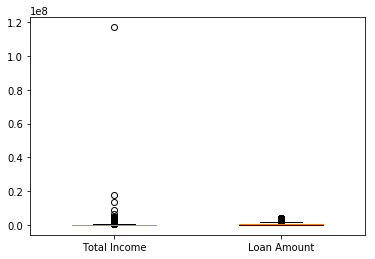

In [17]:
#First we will go with boxplot, this is the easiest to detect the outliers in our dataframe, just by plotting them.
import seaborn as sns
import matplotlib.pyplot as plt

lables = ['Total Income','Loan Amount']
box_plot_data=[applicationDF['AMT_INCOME_TOTAL'],applicationDF['AMT_CREDIT']]
plt.boxplot(box_plot_data,patch_artist=True,labels=lables, widths=0.5)

By the abouve analysis we can see that outlier values are too high, So our box has become so small. In this oulier case, we can handle it by two ways either by removing the outliers or we can replace the outlier values to the maximun value(like 99 percentile) of the column.

Second method to find outlier is boxplot depection, any dataset or any set of observations is divided into four defined intervals based upon the values of the data and how they compare to the entire dataset. A quartile is what divides the data into three points and four intervals. Interquartile Range (IQR) is important because it is used to define the outliers. It is the difference between the third quartile and the first quartile (IQR = Q3 -Q1). Outliers in this case are defined as the observations that are below (Q1 − 1.5x IQR) or boxplot lower whisker or above (Q3 + 1.5x IQR) or boxplot upper whisker.

In [18]:
#We will start with our first coulmn - 'AMT_INCOME_TOTAL' 
#print(applicationDF['AMT_INCOME_TOTAL'].max())
AMT_INCOME_TOTAL_Mean = applicationDF['AMT_INCOME_TOTAL'].median()
AMT_INCOME_TOTAL_Q1 = applicationDF['AMT_INCOME_TOTAL'].quantile(0.25)
AMT_INCOME_TOTAL_Q3 = applicationDF['AMT_INCOME_TOTAL'].quantile(0.75)
AMT_INCOME_TOTAL_IQR = AMT_INCOME_TOTAL_Q3 - AMT_INCOME_TOTAL_Q1
AMT_INCOME_TOTAL_Outlier_Below = AMT_INCOME_TOTAL_Q1 - (1.5*AMT_INCOME_TOTAL_IQR)
AMT_INCOME_TOTAL_Outlier_Above = AMT_INCOME_TOTAL_Q3 + (1.5*AMT_INCOME_TOTAL_IQR)
print("So for column AMT_INCOME_TOTAL outliers are below ", AMT_INCOME_TOTAL_Outlier_Below," and above ",AMT_INCOME_TOTAL_Outlier_Above)

AMT_CREDIT_Mean = applicationDF['AMT_CREDIT'].median()
AMT_CREDIT_Q1 = applicationDF['AMT_CREDIT'].quantile(0.25)
AMT_CREDIT_Q3 = applicationDF['AMT_CREDIT'].quantile(0.75)
AMT_CREDIT_IQR = AMT_CREDIT_Q3 - AMT_CREDIT_Q1
AMT_CREDIT_Outlier_Below = AMT_CREDIT_Q1 - (1.5*AMT_CREDIT_IQR)
AMT_CREDIT_Outlier_Above = AMT_CREDIT_Q3 + (1.5*AMT_CREDIT_IQR)
print("So for column AMT_CREDIT outliers are below ", AMT_CREDIT_Outlier_Below," and above ",AMT_CREDIT_Outlier_Above)

AMT_ANNUITY_Mean = applicationDF['AMT_ANNUITY'].median()
AMT_ANNUITY_Q1 = applicationDF['AMT_ANNUITY'].quantile(0.25)
AMT_ANNUITY_Q3 = applicationDF['AMT_ANNUITY'].quantile(0.75)
AMT_ANNUITY_IQR = AMT_ANNUITY_Q3 - AMT_ANNUITY_Q1
AMT_ANNUITY_Outlier_Below = AMT_ANNUITY_Q1 - (1.5*AMT_ANNUITY_IQR)
AMT_ANNUITY_Outlier_Above = AMT_ANNUITY_Q3 + (1.5*AMT_ANNUITY_IQR)
print("So for column AMT_ANNUITY outliers are below ", AMT_ANNUITY_Outlier_Below," and above ",AMT_ANNUITY_Outlier_Above)

AMT_GOODS_PRICE_Mean = applicationDF['AMT_GOODS_PRICE'].median()
AMT_GOODS_PRICE_Q1 = applicationDF['AMT_GOODS_PRICE'].quantile(0.25)
AMT_GOODS_PRICE_Q3 = applicationDF['AMT_GOODS_PRICE'].quantile(0.75)
AMT_GOODS_PRICE_IQR = AMT_GOODS_PRICE_Q3 - AMT_GOODS_PRICE_Q1
AMT_GOODS_PRICE_Outlier_Below = AMT_GOODS_PRICE_Q1 - (1.5*AMT_GOODS_PRICE_IQR)
AMT_GOODS_PRICE_Outlier_Above = AMT_INCOME_TOTAL_Q3 + (1.5*AMT_GOODS_PRICE_IQR)
print("So for column AMT_GOODS_PRICE outliers are below ", AMT_GOODS_PRICE_Outlier_Below," and above ",AMT_GOODS_PRICE_Outlier_Above)


Work_Experience_Mean = applicationDF['Work_Experience'].median()
Work_Experience_Q1 = applicationDF['Work_Experience'].quantile(0.25)
Work_Experience_Q3 = applicationDF['Work_Experience'].quantile(0.75)
Work_Experience_IQR = Work_Experience_Q3 - Work_Experience_Q1
Work_Experience_Outlier_Below = Work_Experience_Q1 - (1.5*Work_Experience_IQR)
Work_Experience_Outlier_Above = Work_Experience_Q3 + (1.5*Work_Experience_IQR)
print("So for column Work_Experience outliers are below ", Work_Experience_Outlier_Below," and above ",Work_Experience_Outlier_Above)


So for column AMT_INCOME_TOTAL outliers are below  -22500.0  and above  337500.0
So for column AMT_CREDIT outliers are below  -537975.0  and above  1616625.0
So for column AMT_ANNUITY outliers are below  -10584.0  and above  61704.0
So for column AMT_GOODS_PRICE outliers are below  -423000.0  and above  864000.0
So for column Work_Experience outliers are below  -16.5  and above  35.5


So by above IQR method we can detect outlier values which are greater than or less than to these values, In out dataframe we have only positive values, so in order to remove outlier we just replace the values whcih are greate than these values to the capped values, which is 99 percentile value of our column value.

Third way which we find to detect outliers by normal distribution's standard deviation. In statistics, If a data distribution is approximately normal then about 68% of the data values lie within one standard deviation of the mean and about 95% are within two standard deviations, and about 99.7% lie within three standard deviations Therefore, if you have any data point that is more than 3 times the standard deviation, then those points 
are very likely to be anomalous or outliers. So here in our analysis we are removing outliers for few columns .

In [19]:
import numpy as np

def remove_outliers(df):
    outliers={}
    for col in cols:
        if(str(df[col].dtype) != 'object'):
            df = df[np.abs(df[col]-df[col].mean()) < (3*df[col].std())]
            out = df[~(np.abs(df[col]-df[col].mean()) < (3*df[col].std()))]
            outliers = pd.DataFrame(out)
    return df
cols = ['AMT_INCOME_TOTAL','AMT_CREDIT','AMT_GOODS_PRICE','Work_Experience']
applicationDF = remove_outliers(applicationDF)
#print(applicationDF)

Binning of Columns, We will take few colums and then we will bin into different categories so we can analyse our data properly. Here we will categorise 'CNT_FAM_MEMBERS' column which shows number of family member into three different categories. Client having 1 or 2 people in thier family will be replaced as 'Small_Family', client having 3 to 5 people will be replaced as 'Mediocre_Family' and client having more than 5 person will be categories as 'Larger_Family'

Same way we will categories Work_Experience into four different category listed below as per their experience. Fresher - 0 to 2 years of experience Experienced - 2 to 5 years of experience Lead_level - 5 to 10 years of experience Manager_and_Above - 10 to 30 years of experience Manager_and_Above - 30 and above years of experience

In [20]:
bins_family = [0, 2, 5, 20]
labels_family = ['Small_Family','Mediocre_Family','Larger_Family']
applicationDF['CNT_FAM_MEMBERS'] = pd.cut(applicationDF['CNT_FAM_MEMBERS'], bins=bins_family, labels=labels_family)
applicationDF['CNT_FAM_MEMBERS'] =  applicationDF['CNT_FAM_MEMBERS'].astype(object)
bins_experience = [0, 2, 5, 10,25,35]
labels_experience = ['Fresher','Experienced','Lead_level','Manager_and_Above','About_to_Retire']
applicationDF['Work_Experience'] = pd.cut(applicationDF['Work_Experience'], bins=bins_experience, labels=labels_experience)
applicationDF['Work_Experience'] =  applicationDF['Work_Experience'].astype(object)
#print(applicationDF['Work_Experience'])
#print(applicationDF['CNT_FAM_MEMBERS'])

Now we will check the imbalance percentage with respect to Target column. Where target has value 1 and 0. Target variable (1 - client with payment difficulties: he/she had late payment more than X days on at least one of the first Y installments of the loan in our sample, 0 - all other cases).
Imbalance percentage can be checked by count of rows having value as 1 divide by count of rows having value as 0.

In [21]:
count_Target = applicationDF.apply(lambda x: True if x['TARGET'] == 1 else False , axis=1)
# Count number of True in series
numOfRows_One = len(count_Target[count_Target == True].index)
numOfRows_Zero = len(count_Target[count_Target == False].index)
print("Imbalance percentage for our dataframe with respect to target value 1 is : ", (numOfRows_One/numOfRows_Zero)*100)

Imbalance percentage for our dataframe with respect to target value 1 is :  8.890041268068378


Now we will divide our dataframe into two different data frames one is for Target value 1 and other is Target value 0 ,So we can analyse our data with both the values one is we can say is defaulter and other are remaining client.

In [22]:
df_Target_One = applicationDF[applicationDF['TARGET'] == 1]
df_Target_Zero = applicationDF[applicationDF['TARGET'] == 0]

In [23]:
#Checking info for the newly created dataframes
print(df_Target_One.info())
print(df_Target_Zero.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 24515 entries, 0 to 307509
Data columns (total 27 columns):
SK_ID_CURR             24515 non-null int64
TARGET                 24515 non-null object
NAME_CONTRACT_TYPE     24515 non-null object
CODE_GENDER            24515 non-null object
FLAG_OWN_CAR           24515 non-null object
FLAG_OWN_REALTY        24515 non-null object
CNT_CHILDREN           24515 non-null int64
AMT_INCOME_TOTAL       24515 non-null float64
AMT_CREDIT             24515 non-null float64
AMT_ANNUITY            24515 non-null float64
AMT_GOODS_PRICE        24515 non-null float64
NAME_INCOME_TYPE       24515 non-null object
NAME_EDUCATION_TYPE    24515 non-null object
NAME_FAMILY_STATUS     24515 non-null object
NAME_HOUSING_TYPE      24515 non-null object
DAYS_BIRTH             24515 non-null int64
DAYS_EMPLOYED          24515 non-null int64
DAYS_REGISTRATION      24515 non-null float64
DAYS_ID_PUBLISH        24515 non-null int64
FLAG_MOBIL             24515 non-nu

Now we will do univariate analysis for the categorical colums for both(Target 1 and 0) the dataframe. So to do so first we divide both the dataset into further two dataset each for numeric and categorical column, so we can iterate easily and plot them easily.

In [24]:
numericCols = []
nonNumericCols = []
for col in df_Target_One.columns:
    if(str(df_Target_One[col].dtype) != 'object'):
        numericCols.append(col)
    else:
        nonNumericCols.append(col)

df_Target_One_numeric = df_Target_One[numericCols]
df_Target_One_Non_numeric = df_Target_One[nonNumericCols]

df_Target_Zero_numeric = df_Target_Zero[numericCols]
df_Target_Zero_Non_numeric = df_Target_Zero[nonNumericCols]

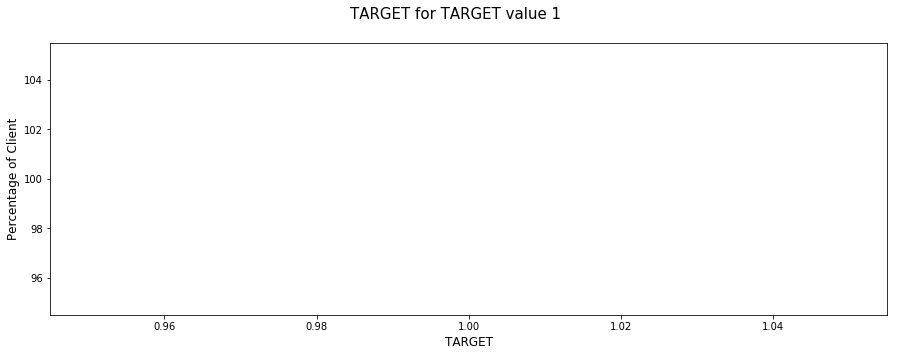

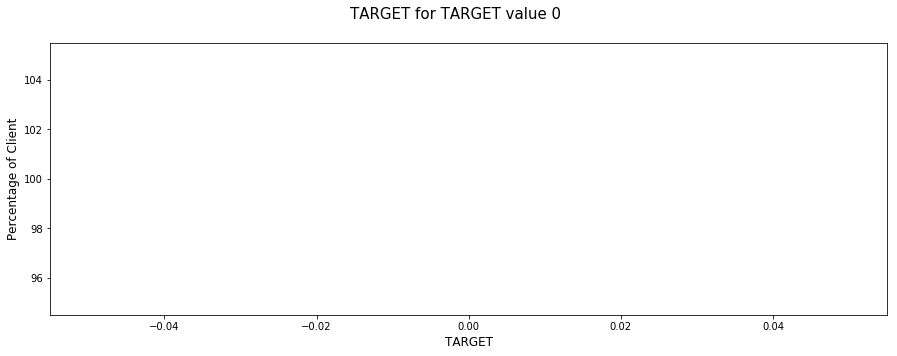

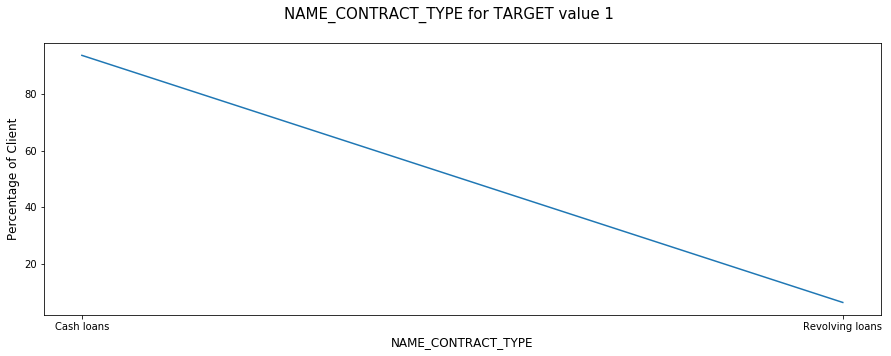

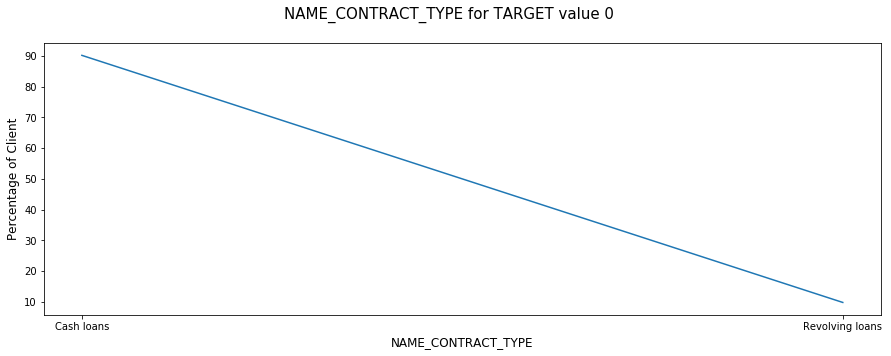

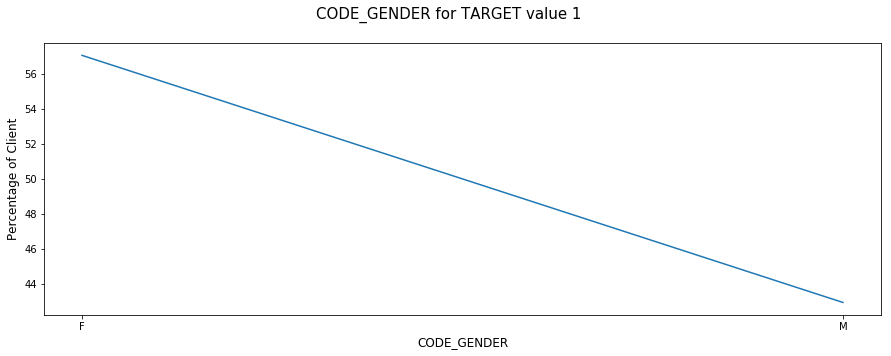

...

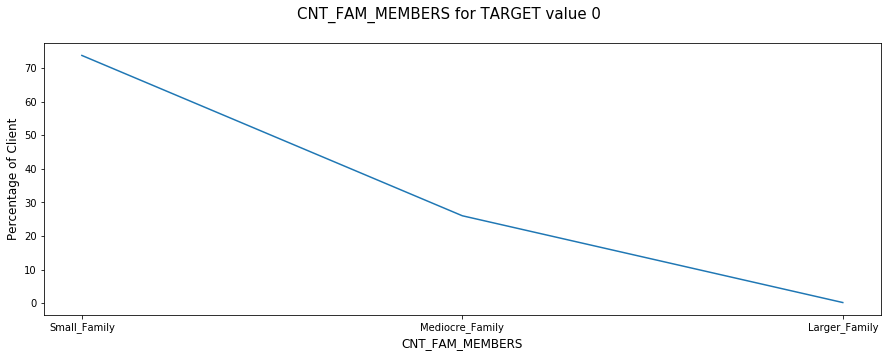

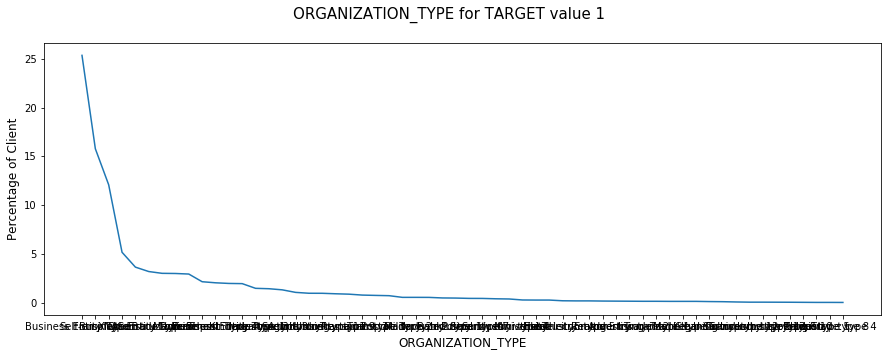

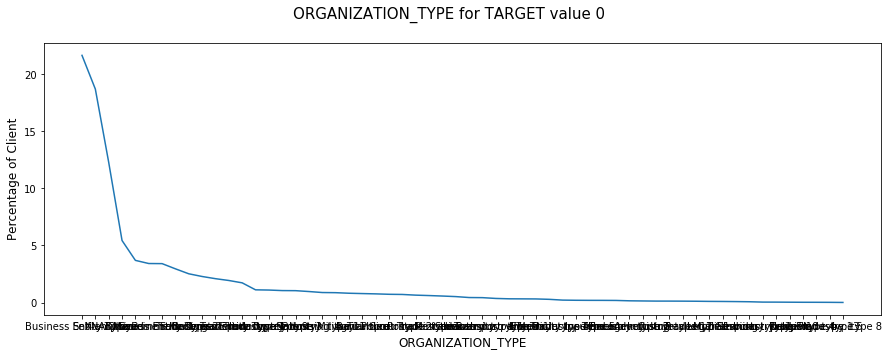

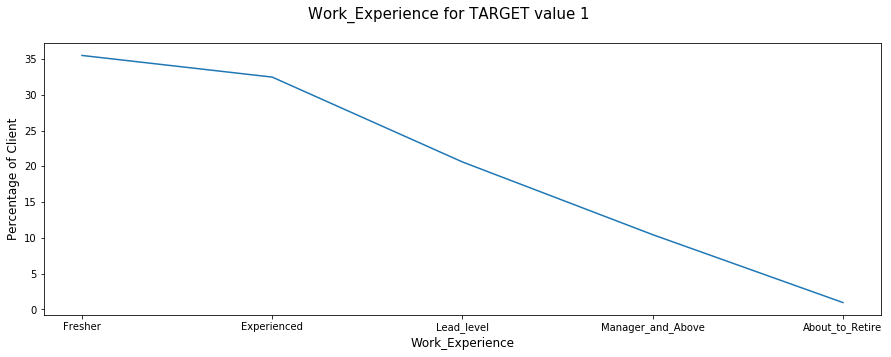

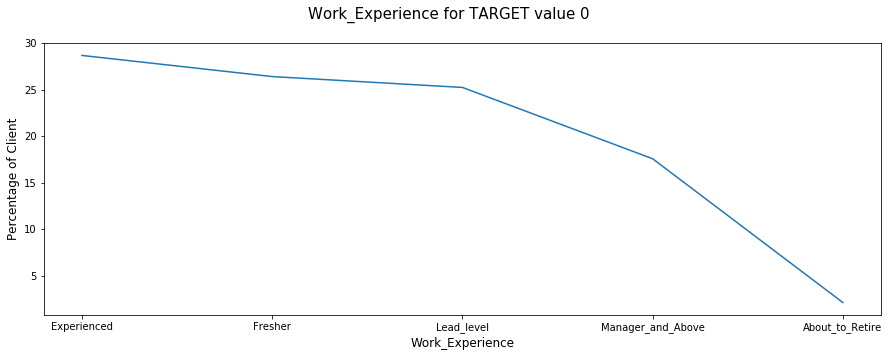

In [25]:
for col in df_Target_One_Non_numeric.columns:
    fig = plt.figure()
    fig.set_size_inches(15, 5)
    plt.plot(df_Target_One_Non_numeric[col].value_counts(normalize=True)*100)
    title = col + " for TARGET value 1"
    fig.suptitle(title, fontsize=15)
    plt.xlabel(col, fontsize=12)
    plt.ylabel('Percentage of Client', fontsize=12)
    plt.show()
    
    fig = plt.figure()
    fig.set_size_inches(15, 5)
    plt.plot(df_Target_Zero_Non_numeric[col].value_counts(normalize=True)*100)
    title = col + " for TARGET value 0"
    fig.suptitle(title, fontsize=15)
    plt.xlabel(col, fontsize=12)
    plt.ylabel('Percentage of Client', fontsize=12)
    plt.show()
    

After Univariate analysis we will check for the correlation between these columns, so for that we will generate correlation matrix by corr() method.

In [26]:
df_Target_One_numeric.corr() 

,SK_ID_CURR,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_EMAIL,Age
SK_ID_CURR,1.000000,-0.005108,-0.003728,-0.003084,-0.009562,-0.003524,-0.001584,-0.004322,0.005683,-0.002708,0.000096,0.001643
CNT_CHILDREN,-0.005108,1.000000,-0.000278,0.001795,0.034656,-0.004967,0.258945,-0.192636,0.148869,-0.032039,0.013174,-0.258756
AMT_INCOME_TOTAL,-0.003728,-0.000278,1.000000,0.317526,0.401186,0.320700,0.001699,-0.116596,0.037604,0.001109,0.096478,-0.001663
AMT_CREDIT,-0.003084,0.001795,0.317526,1.000000,0.732433,0.980392,-0.136519,0.002190,-0.032050,-0.050187,0.004612,0.136572
AMT_ANNUITY,-0.009562,0.034656,0.401186,0.732433,1.000000,0.734636,-0.005708,-0.085502,0.035246,-0.011624,0.076333,0.005702
AMT_GOODS_PRICE,-0.003524,-0.004967,0.320700,0.980392,0.734636,1.000000,-0.137565,0.007205,-0.032286,-0.054696,0.008242,0.137551
DAYS_BIRTH,-0.001584,0.258945,0.001699,-0.136519,-0.005708,-0.137565,1.000000,-0.576492,0.289281,0.253691,0.062538,-0.999680
DAYS_EMPLOYED,-0.004322,-0.192636,-0.116596,0.002190,-0.085502,0.007205,-0.576492,1.000000,-0.189423,-0.226386,-0.040164,0.576057
DAYS_REGISTRATION,0.005683,0.148869,0.037604,-0.032050,0.035246,-0.032286,0.289281,-0.189423,1.000000,0.097567,0.022062,-0.288967
DAYS_ID_PUBLISH,-0.002708,-0.032039,0.001109,-0.050187,-0.011624,-0.054696,0.253691,-0.226386,0.097567,1.000000,0.027985,-0.253867


In [27]:
df_Target_Zero_numeric.corr() 

,SK_ID_CURR,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_EMAIL,Age
SK_ID_CURR,1.000000,-0.000992,0.002176,-0.000617,0.000771,-0.000482,-0.001458,0.001804,-0.001253,-0.000030,0.000101,0.001448
CNT_CHILDREN,-0.000992,1.000000,0.032683,0.003507,0.023051,-0.000730,0.337291,-0.245035,0.186817,-0.027494,0.022679,-0.337164
AMT_INCOME_TOTAL,0.002176,0.032683,1.000000,0.358315,0.448144,0.365634,0.080680,-0.171161,0.075616,0.030765,0.098113,-0.080650
AMT_CREDIT,-0.000617,0.003507,0.358315,1.000000,0.747521,0.984396,-0.050841,-0.069097,0.006806,0.000477,0.008118,0.050925
AMT_ANNUITY,0.000771,0.023051,0.448144,0.747521,1.000000,0.754543,0.017346,-0.107487,0.037690,0.018051,0.066042,-0.017271
AMT_GOODS_PRICE,-0.000482,-0.000730,0.365634,0.984396,0.754543,1.000000,-0.048783,-0.067303,0.009193,-0.001817,0.007709,0.048857
DAYS_BIRTH,-0.001458,0.337291,0.080680,-0.050841,0.017346,-0.048783,1.000000,-0.621378,0.334253,0.275098,0.091947,-0.999708
DAYS_EMPLOYED,0.001804,-0.245035,-0.171161,-0.069097,-0.107487,-0.067303,-0.621378,1.000000,-0.211467,-0.277487,-0.063845,0.621097
DAYS_REGISTRATION,-0.001253,0.186817,0.075616,0.006806,0.037690,0.009193,0.334253,-0.211467,1.000000,0.101443,0.035102,-0.334214
DAYS_ID_PUBLISH,-0.000030,-0.027494,0.030765,0.000477,0.018051,-0.001817,0.275098,-0.277487,0.101443,1.000000,0.027581,-0.275306


Generating pairplot to check for the correlation of the numeric columns

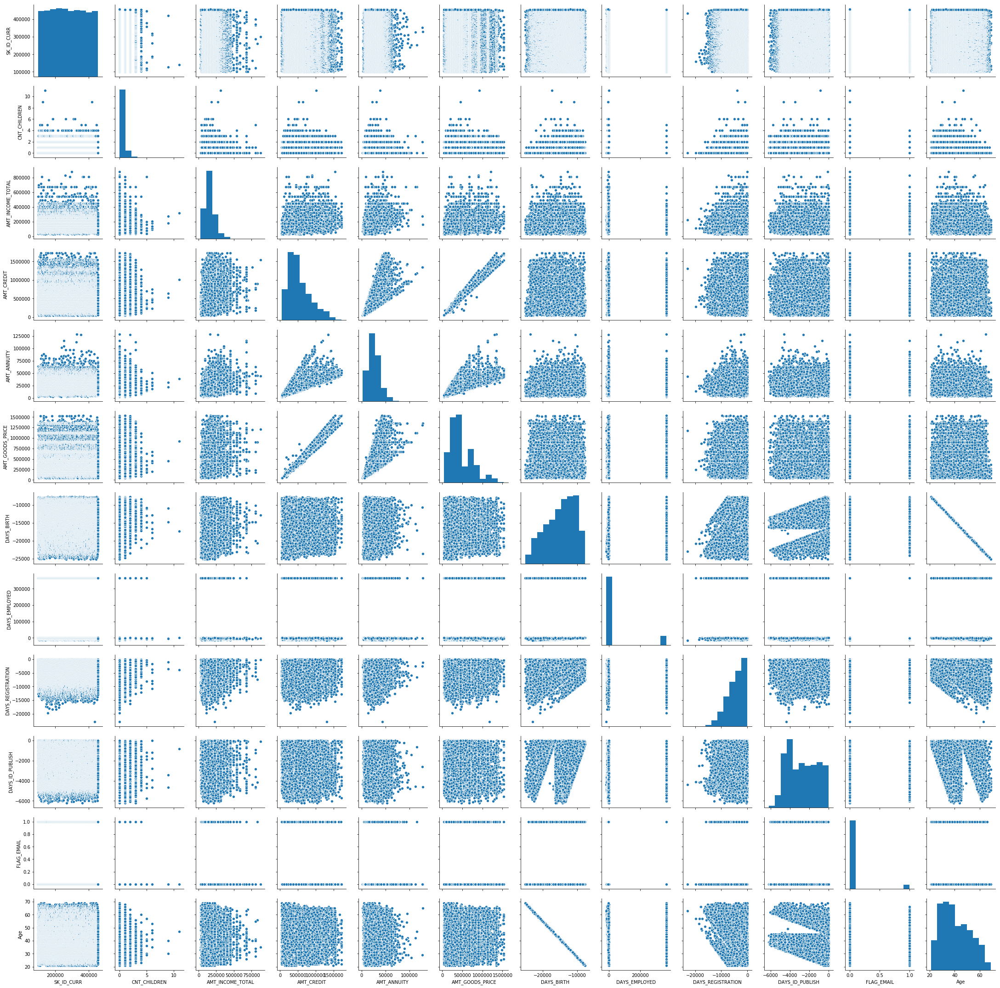

In [28]:
sns.pairplot(df_Target_One_numeric)
plt.show()

/Users/lifesight/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:824: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Users/lifesight/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:825: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


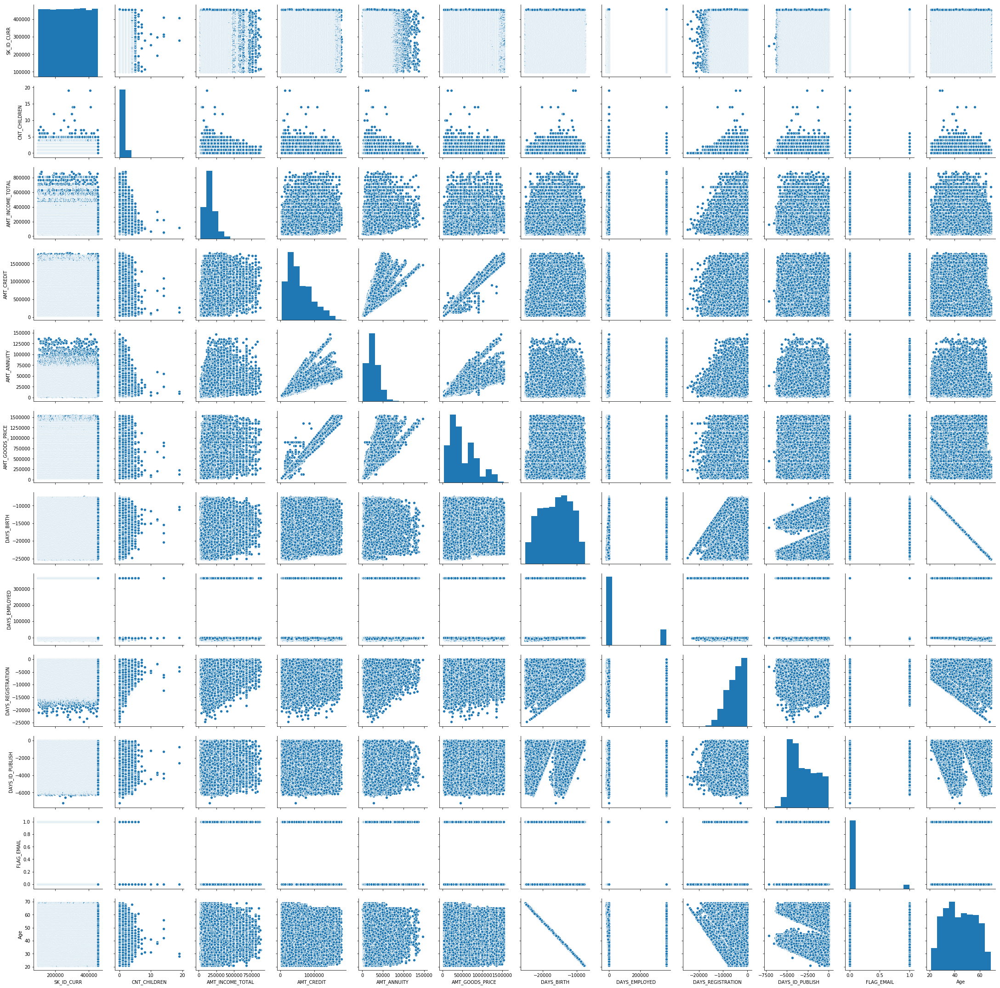

In [29]:
sns.pairplot(df_Target_Zero_numeric)
plt.show()

For Bivariate analysis or for the correlation, heatmap is best plot to check

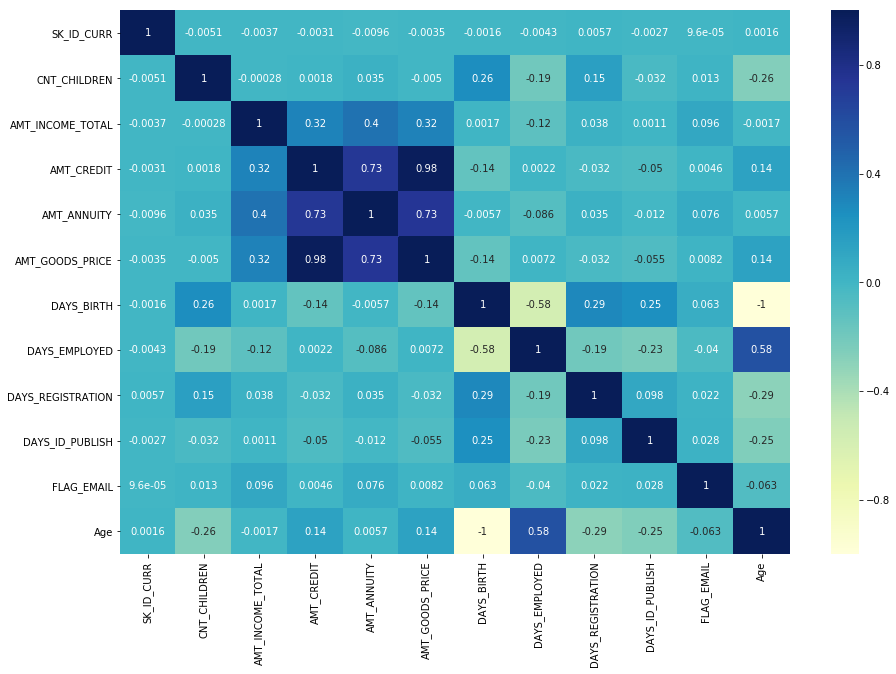

In [30]:
plt.figure(figsize=(15,10))
sns.heatmap(df_Target_One_numeric.corr(), cmap="YlGnBu", annot=True)
plt.show()

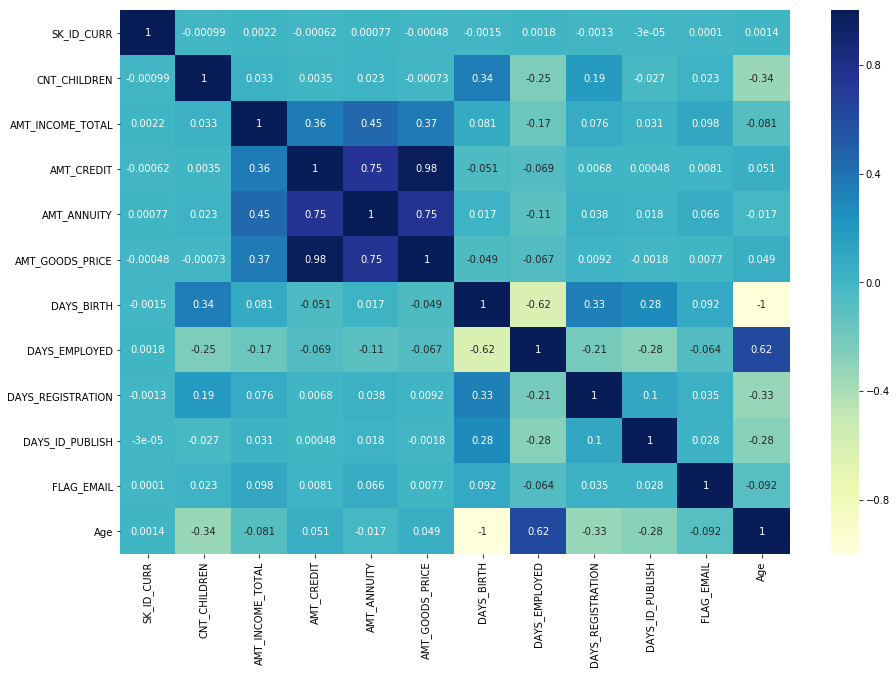

In [31]:
plt.figure(figsize=(15,10))
sns.heatmap(df_Target_Zero_numeric.corr(), cmap="YlGnBu", annot=True)
plt.show()

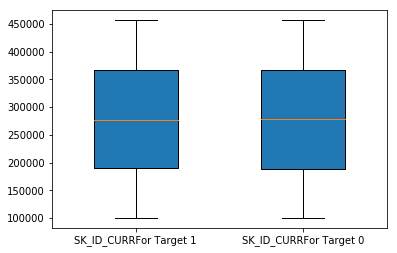

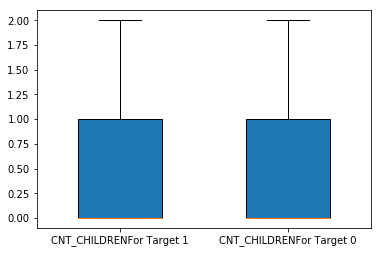

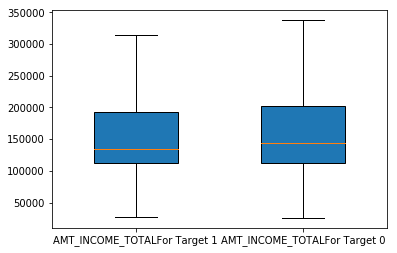

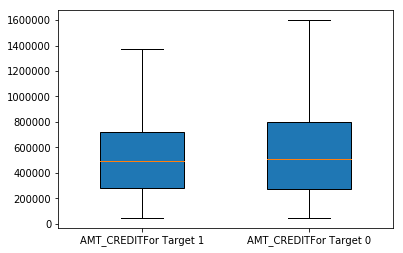

/Users/lifesight/anaconda3/lib/python3.7/site-packages/numpy/lib/function_base.py:3826: RuntimeWarning: Invalid value encountered in percentile
  interpolation=interpolation)
/Users/lifesight/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1246: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = np.compress(x <= hival, x)
/Users/lifesight/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1253: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = np.compress(x >= loval, x)
/Users/lifesight/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1261: RuntimeWarning: invalid value encountered in less
  np.compress(x < stats['whislo'], x),
/Users/lifesight/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1262: RuntimeWarning: invalid value encountered in greater
  np.compress(x > stats['whishi'], x)


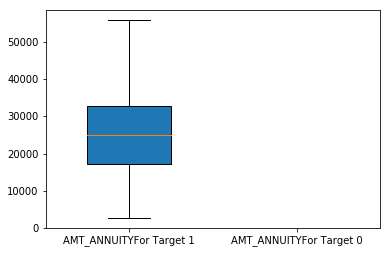

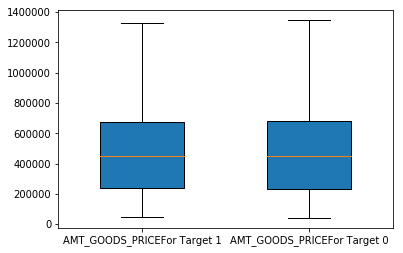

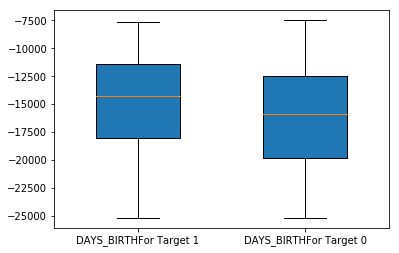

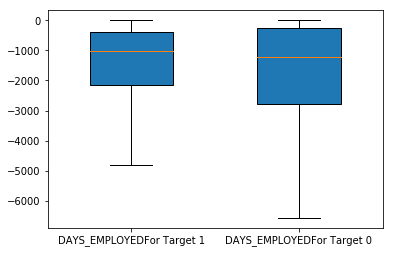

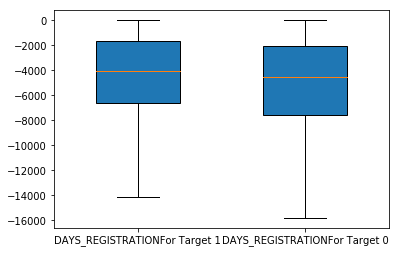

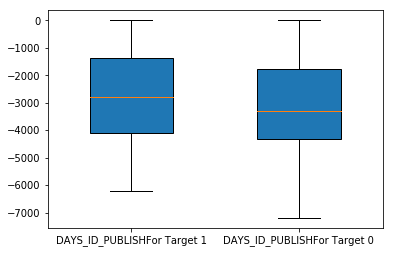

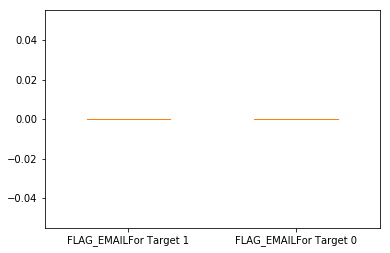

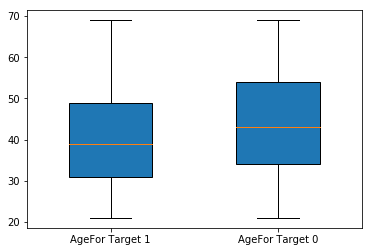

In [32]:
for col in df_Target_One_numeric.columns:
    l1 = col + "For Target 1"
    l2 = col + "For Target 0"
    lables = [l1,l2]
    box_plot_data=[df_Target_One_numeric[col],df_Target_Zero_numeric[col]]
    plt.boxplot(box_plot_data,patch_artist=True,labels=lables, widths=0.5, showfliers=False)
    plt.show()

Now we have one more data set which has data for client's previous loan application, So First we will read the csv file then we will merge both the analysis. In both the datasets we have comman column and it is unique column also, so we can consider it as a Primary Key which is 'SK_ID_CURR', so we need all the data from application dataset and common dataset from previous application file in order get this we will go for left join and after merging both the dataset we will do univariate and bivariate analysis.

In [33]:
# Read the csv file for previous applications
previous_applicationDF = pd.read_csv("/Users/lifesight/Desktop/EDA_Case Study/previous_application.csv")

#Checking our data
print(previous_applicationDF.info())
print(previous_applicationDF.shape)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
SK_ID_PREV                     1670214 non-null int64
SK_ID_CURR                     1670214 non-null int64
NAME_CONTRACT_TYPE             1670214 non-null object
AMT_ANNUITY                    1297979 non-null float64
AMT_APPLICATION                1670214 non-null float64
AMT_CREDIT                     1670213 non-null float64
AMT_DOWN_PAYMENT               774370 non-null float64
AMT_GOODS_PRICE                1284699 non-null float64
WEEKDAY_APPR_PROCESS_START     1670214 non-null object
HOUR_APPR_PROCESS_START        1670214 non-null int64
FLAG_LAST_APPL_PER_CONTRACT    1670214 non-null object
NFLAG_LAST_APPL_IN_DAY         1670214 non-null int64
RATE_DOWN_PAYMENT              774370 non-null float64
RATE_INTEREST_PRIMARY          5951 non-null float64
RATE_INTEREST_PRIVILEGED       5951 non-null float64
NAME_CASH_LOAN_PURPOSE         1670214 non-null object
NAME_CONTRA

In [34]:
#Merging both the dataframes by left join on primary key SK_ID_CURR
joined_df = pd.merge(applicationDF, previous_applicationDF, how ='left', on ='SK_ID_CURR') 
print(joined_df.columns)

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE_x', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT_x', 'AMT_ANNUITY_x', 'AMT_GOODS_PRICE_x',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION',
       'DAYS_ID_PUBLISH', 'FLAG_MOBIL', 'FLAG_CONT_MOBILE', 'FLAG_EMAIL',
       'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS', 'ORGANIZATION_TYPE', 'Age',
       'Work_Experience', 'SK_ID_PREV', 'NAME_CONTRACT_TYPE_y',
       'AMT_ANNUITY_y', 'AMT_APPLICATION', 'AMT_CREDIT_y', 'AMT_DOWN_PAYMENT',
       'AMT_GOODS_PRICE_y', 'WEEKDAY_APPR_PROCESS_START',
       'HOUR_APPR_PROCESS_START', 'FLAG_LAST_APPL_PER_CONTRACT',
       'NFLAG_LAST_APPL_IN_DAY', 'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'NAME_CASH_LOAN_PURPOSE',
       'NAME_CONTRACT_STATUS', 'DAYS_DECISION', 'NAME_PAYMENT_TYPE',
       'CODE_REJE

In [35]:
#Validating the merged dataframe
print(joined_df.shape)
print(joined_df.info)

(1402739, 63)
<bound method DataFrame.info of          SK_ID_CURR TARGET NAME_CONTRACT_TYPE_x CODE_GENDER FLAG_OWN_CAR  \
0            100002      1           Cash loans           M            N   
1            100003      0           Cash loans           F            N   
2            100003      0           Cash loans           F            N   
3            100003      0           Cash loans           F            N   
4            100004      0      Revolving loans           M            Y   
5            100006      0           Cash loans           F            N   
6            100006      0           Cash loans           F            N   
7            100006      0           Cash loans           F            N   
8            100006      0           Cash loans           F            N   
9            100006      0           Cash loans           F            N   
10           100006      0           Cash loans           F            N   
11           100006      0           Cash 

In [36]:
#Finding the percentage of missing values in merged dataset:-
percent_missing = joined_df.isnull().sum() * 100 / len(joined_df)
missing_value_df = pd.DataFrame({'column_name': joined_df.columns,
                                 'percent_missing': percent_missing})
missing_value_df.sort_values('percent_missing', inplace=True, ascending=False)

print(missing_value_df.head(60))

                                             column_name  percent_missing
RATE_INTEREST_PRIVILEGED        RATE_INTEREST_PRIVILEGED        99.665868
RATE_INTEREST_PRIMARY              RATE_INTEREST_PRIMARY        99.665868
AMT_DOWN_PAYMENT                        AMT_DOWN_PAYMENT        53.621308
RATE_DOWN_PAYMENT                      RATE_DOWN_PAYMENT        53.621308
NAME_TYPE_SUITE                          NAME_TYPE_SUITE        49.753661
NFLAG_INSURED_ON_APPROVAL      NFLAG_INSURED_ON_APPROVAL        40.399461
DAYS_TERMINATION                        DAYS_TERMINATION        40.399461
DAYS_LAST_DUE                              DAYS_LAST_DUE        40.399461
DAYS_LAST_DUE_1ST_VERSION      DAYS_LAST_DUE_1ST_VERSION        40.399461
DAYS_FIRST_DUE                            DAYS_FIRST_DUE        40.399461
DAYS_FIRST_DRAWING                    DAYS_FIRST_DRAWING        40.399461
OCCUPATION_TYPE                          OCCUPATION_TYPE        32.432120
AMT_GOODS_PRICE_y                     

In [37]:
#Removing rows which are having missing values more than 40%
joined_df = joined_df.loc[:, joined_df.isnull().sum() * 100 / len(applicationDF) < 40]
print(joined_df.columns)

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE_x', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT_x', 'AMT_ANNUITY_x', 'AMT_GOODS_PRICE_x',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION',
       'DAYS_ID_PUBLISH', 'FLAG_MOBIL', 'FLAG_CONT_MOBILE', 'FLAG_EMAIL',
       'CNT_FAM_MEMBERS', 'ORGANIZATION_TYPE', 'Age', 'SK_ID_PREV',
       'NAME_CONTRACT_TYPE_y', 'AMT_APPLICATION', 'AMT_CREDIT_y',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NFLAG_LAST_APPL_IN_DAY',
       'NAME_CASH_LOAN_PURPOSE', 'NAME_CONTRACT_STATUS', 'DAYS_DECISION',
       'NAME_PAYMENT_TYPE', 'CODE_REJECT_REASON', 'NAME_CLIENT_TYPE',
       'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE',
       'CHANNEL_TYPE', 'SELLERPLACE_AREA', 'NAME_SELLER_INDUSTRY',
       'NAME_YIELD_GROU

In [38]:
#Removing few more columns which we are not using for our analysis as either meta data is not clear about these data
#or we are not considereing for our analysis.
joined_df = joined_df[joined_df.columns.drop(list(joined_df.filter(regex='SK_ID_PREV')))]
joined_df = joined_df[joined_df.columns.drop(list(joined_df.filter(regex='_APPR_PROCESS_START')))]
joined_df = joined_df[joined_df.columns.drop(list(joined_df.filter(regex='DAYS_DECISION')))]
joined_df = joined_df[joined_df.columns.drop(list(joined_df.filter(regex='DAYS_ID_PUBLISH')))]
joined_df = joined_df[joined_df.columns.drop(list(joined_df.filter(regex='CNT_CHILDREN')))]
joined_df = joined_df[joined_df.columns.drop(list(joined_df.filter(regex='LAST_APPL')))]
joined_df = joined_df[joined_df.columns.drop(list(joined_df.filter(regex='REJECT_REASON')))]
joined_df = joined_df[joined_df.columns.drop(list(joined_df.filter(regex='NAME_PORTFOLIO')))]
joined_df = joined_df[joined_df.columns.drop(list(joined_df.filter(regex='NAME_PRODUCT_TYPE')))]
joined_df = joined_df[joined_df.columns.drop(list(joined_df.filter(regex='CHANNEL_TYPE')))]
joined_df = joined_df[joined_df.columns.drop(list(joined_df.filter(regex='NAME_SELLER_INDUSTRY')))]
#print(joined_df.columns)
#print(joined_df.shape)
#print(joined_df.head())

In [39]:
#Checking the imbalance of target value 1 for merged data set which should be approximatly same for the application dataset
count_Target = joined_df.apply(lambda x: True if x['TARGET'] == 1 else False , axis=1)
# Count number of True in series
numOfRows_One = len(count_Target[count_Target == True].index)
numOfRows_Zero = len(count_Target[count_Target == False].index)
print("Imbalance for target value 1 is : ", (numOfRows_One/numOfRows_Zero)*100)

Imbalance for target value 1 is :  9.514805206161139


Now after merging we will divide our data set into two different dataset on basis of target value, so we can compare
all the columns for defaulter(Target1) and else(Target0), And can analysis our result by comparing them and can show 
the values dieefeence of columns for both the target values.

In [40]:
joined_df_Target_One = joined_df[joined_df['TARGET'] == 1]
joined_df_Target_Zero = joined_df[joined_df['TARGET'] == 0]

Now we have two merged dataset, First is 'joined_df_Target_One' which has all the rows for the defaulter client.
Second dataset is for 'joined_df_Target_Zero' which has all the rows for the non defaulter client.
We will analyse their numeric columns and non-numeric columns seprately, So we will further divide each data set into two more dataset one is for numeric columns and other is for non-numeric colums. So our analysis will be easy One we can comare all numeric columns and second we can compare non-numeric columns to get our result.

In [41]:
numericColsForDF = []
nonNumericColsForDF = []
for col in joined_df.columns:
    if(str(joined_df[col].dtype) != 'object'):
        numericColsForDF.append(col)
    else:
        nonNumericColsForDF.append(col)

#Creating df for only numeric columns so we can plot correlation graph
merged_df_Target_One_numeric = joined_df_Target_One[numericColsForDF]
merged_df_Target_One_Non_numeric = joined_df_Target_One[nonNumericColsForDF]

merged_df_Target_Zero_numeric = joined_df_Target_Zero[numericColsForDF]
merged_df_Target_Zero_Non_numeric = joined_df_Target_Zero[nonNumericColsForDF]

So now we have four different dataset for merged dataset.
1) merged_df_Target_One_numeric => Having only numeric columns for target value 1(defaulter)
1) merged_df_Target_One_Non_numeric => Having only categorical columns for target value 1(defaulter)
1) merged_df_Target_Zero_numeric => Having only numeric columns for target value 0(non-defaulter)
1) merged_df_Target_Zero_Non_numeric => Having only categorical columns for target value 0(non-defaulter)

In [42]:
#For numeric columns we will check the correlation matrix to see what all columns are highely correlated and can make 
#strong impact to see a client is defaulter or not.
merged_df_Target_One_numeric.corr(method ='kendall') 

,SK_ID_CURR,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE_x,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,FLAG_EMAIL,Age,AMT_APPLICATION,AMT_CREDIT_y,SELLERPLACE_AREA
SK_ID_CURR,1.000000,-0.000015,-0.002157,-0.004103,-0.001833,-0.001542,-0.010755,0.004608,0.002219,0.001834,0.002043,0.001512,-0.001119
AMT_INCOME_TOTAL,-0.000015,1.000000,0.219931,0.272905,0.225131,-0.016298,-0.070975,0.019069,0.085135,0.016367,0.050202,0.055126,-0.049177
AMT_CREDIT_x,-0.002157,0.219931,1.000000,0.611276,0.887321,-0.086452,-0.053245,-0.008703,0.012283,0.087688,0.044431,0.049720,0.001999
AMT_ANNUITY_x,-0.004103,0.272905,0.611276,1.000000,0.609296,-0.000286,-0.066775,0.031821,0.058578,0.000378,0.039536,0.040235,0.006833
AMT_GOODS_PRICE_x,-0.001833,0.225131,0.887321,0.609296,1.000000,-0.088867,-0.056178,-0.010385,0.016028,0.090090,0.047893,0.052329,0.005404
DAYS_BIRTH,-0.001542,-0.016298,-0.086452,-0.000286,-0.088867,1.000000,-0.077590,0.159135,0.055101,-0.987542,-0.040197,-0.047376,0.110468
DAYS_EMPLOYED,-0.010755,-0.070975,-0.053245,-0.066775,-0.056178,-0.077590,1.000000,-0.004195,-0.012886,0.078562,-0.010627,-0.018125,0.000873
DAYS_REGISTRATION,0.004608,0.019069,-0.008703,0.031821,-0.010385,0.159135,-0.004195,1.000000,0.023008,-0.160809,-0.004444,-0.004515,0.025322
FLAG_EMAIL,0.002219,0.085135,0.012283,0.058578,0.016028,0.055101,-0.012886,0.023008,1.000000,-0.055829,0.016996,0.019567,-0.030084
Age,0.001834,0.016367,0.087688,0.000378,0.090090,-0.987542,0.078562,-0.160809,-0.055829,1.000000,0.040599,0.047876,-0.111618


So by above analysis for defaulters we can see that below columns are highly correlated.
1) AMT_CREDIT_x & AMT_GOODS_PRICE_x
2) AMT_APPLICATION & AMT_CREDIT_y
3) AMT_CREDIT_x & AMT_ANNUITY_x
4) AMT_GOODS_PRICE_x & AMT_ANNUITY_x 
5) AMT_INCOME_TOTAL & AMT_GOODS_PRICE_x

In [43]:
merged_df_Target_Zero_numeric.corr(method ='kendall') 

,SK_ID_CURR,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE_x,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,FLAG_EMAIL,Age,AMT_APPLICATION,AMT_CREDIT_y,SELLERPLACE_AREA
SK_ID_CURR,1.000000,0.001893,0.000039,-0.000664,0.000180,-0.001669,0.002340,-0.003127,-0.000304,0.001694,0.000108,0.000236,0.000001
AMT_INCOME_TOTAL,0.001893,1.000000,0.264534,0.320108,0.268528,0.054342,-0.111789,0.044142,0.085121,-0.054958,0.059810,0.064105,-0.045680
AMT_CREDIT_x,0.000039,0.264534,1.000000,0.623960,0.907525,-0.025207,-0.076894,0.006186,0.007186,0.025530,0.044905,0.050830,0.001505
AMT_ANNUITY_x,-0.000664,0.320108,0.623960,1.000000,0.625140,0.027483,-0.086164,0.029684,0.048205,-0.027768,0.049956,0.051551,0.000730
AMT_GOODS_PRICE_x,0.000180,0.268528,0.907525,0.625140,1.000000,-0.026199,-0.078477,0.006660,0.006673,0.026532,0.046704,0.051335,0.005579
DAYS_BIRTH,-0.001669,0.054342,-0.025207,0.027483,-0.026199,1.000000,-0.164279,0.204055,0.082558,-0.988446,-0.035442,-0.037264,0.093606
DAYS_EMPLOYED,0.002340,-0.111789,-0.076894,-0.086164,-0.078477,-0.164279,1.000000,-0.028066,-0.025171,0.166124,-0.007206,-0.014861,-0.026908
DAYS_REGISTRATION,-0.003127,0.044142,0.006186,0.029684,0.006660,0.204055,-0.028066,1.000000,0.030222,-0.206317,-0.007815,-0.008883,0.031319
FLAG_EMAIL,-0.000304,0.085121,0.007186,0.048205,0.006673,0.082558,-0.025171,0.030222,1.000000,-0.083476,0.017038,0.020982,-0.024371
Age,0.001694,-0.054958,0.025530,-0.027768,0.026532,-0.988446,0.166124,-0.206317,-0.083476,1.000000,0.035837,0.037675,-0.094628


So by above analysis for defaulters we can see that below columns are highly correlated.
1) AMT_CREDIT_x & AMT_GOODS_PRICE_x
2) AMT_APPLICATION & AMT_CREDIT_y
3) AMT_CREDIT_x & AMT_ANNUITY_x
4) AMT_GOODS_PRICE_x & AMT_ANNUITY_x 
5) AMT_INCOME_TOTAL & AMT_GOODS_PRICE_x

We can analise correlation by pair plot also, so below are visual representation of that.

/Users/lifesight/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:824: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Users/lifesight/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:825: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


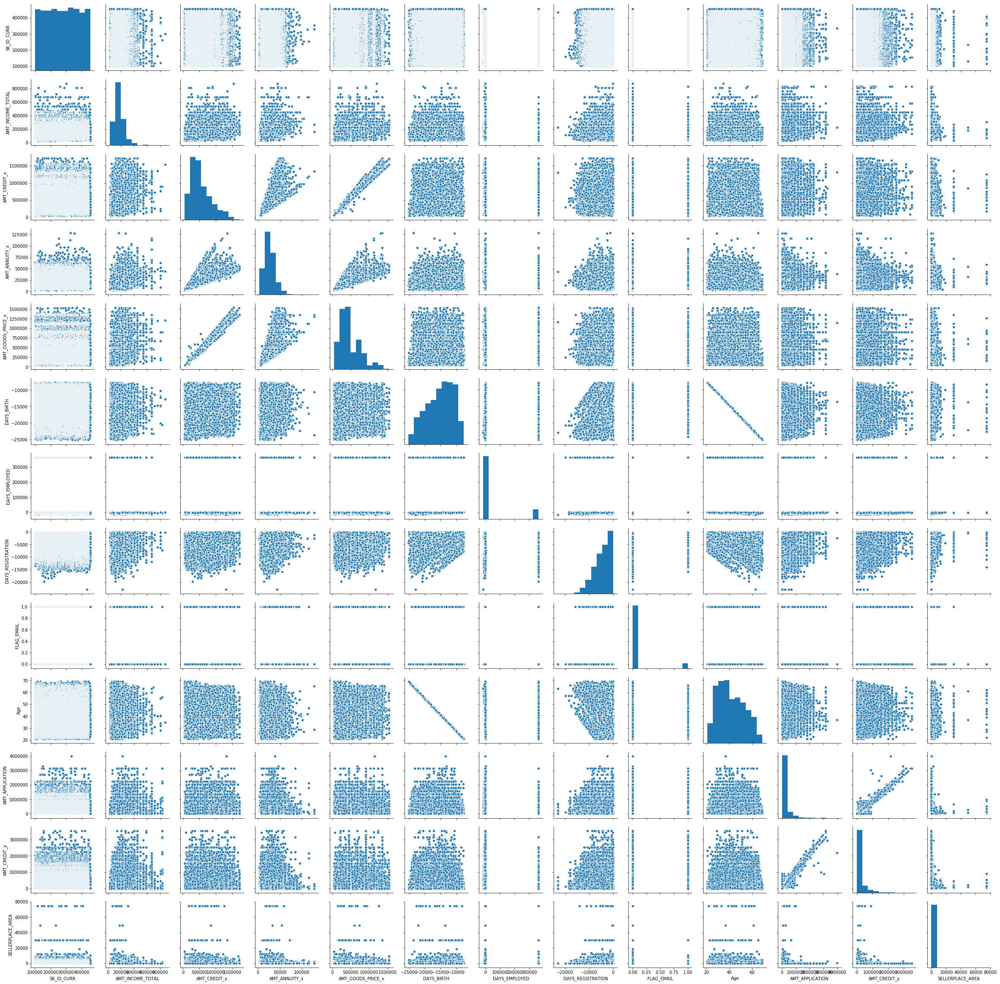

In [44]:
#pair plot for numeric columns of defaulters
sns.pairplot(merged_df_Target_One_numeric)
plt.show()

In [ ]:
#Pair plot representation for non defaulter 
sns.pairplot(merged_df_Target_Zero_numeric)
plt.show()

Another way to check the correlation is HeatMap, which can clearly show the visual representation by color brightness for highly correlated columns.
So below we plot heatmap for numeric columns for both defaulter and non-defaulted clients and can clearly see the correlation between the columns, which indicates that client will be defaulter or not.

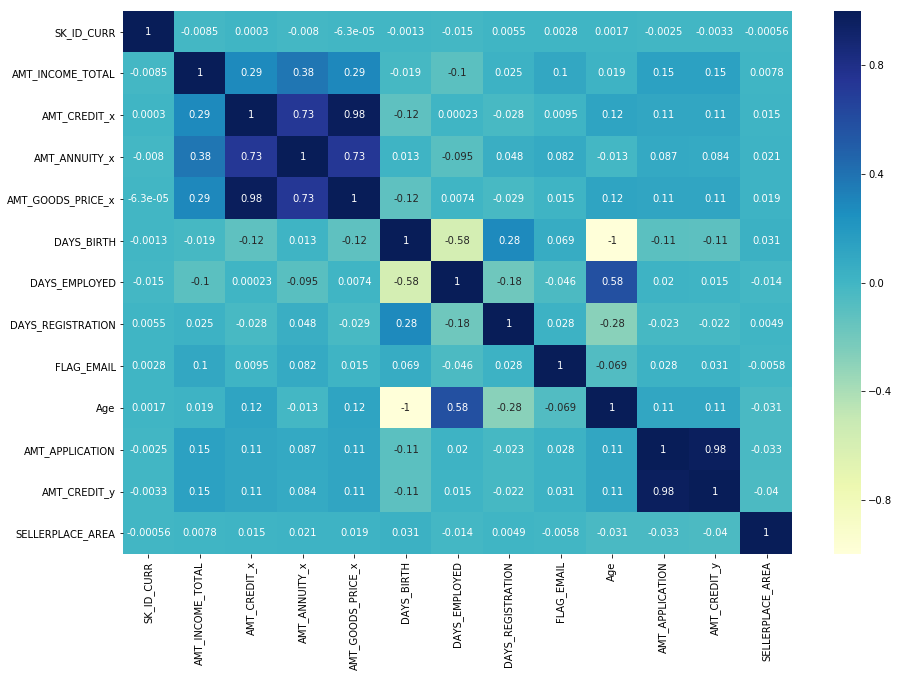

In [46]:
plt.figure(figsize=(15,10))
sns.heatmap(merged_df_Target_One_numeric.corr(), cmap="YlGnBu", annot=True)
plt.show()

So by above analysis for defaulters we can see that below columns are highly correlated.
1) AMT_CREDIT_x & AMT_GOODS_PRICE_x
2) AMT_APPLICATION & AMT_CREDIT_y
3) AMT_CREDIT_x & AMT_ANNUITY_x
4) AMT_GOODS_PRICE_x & AMT_ANNUITY_x 
5) AMT_INCOME_TOTAL & AMT_GOODS_PRICE_x

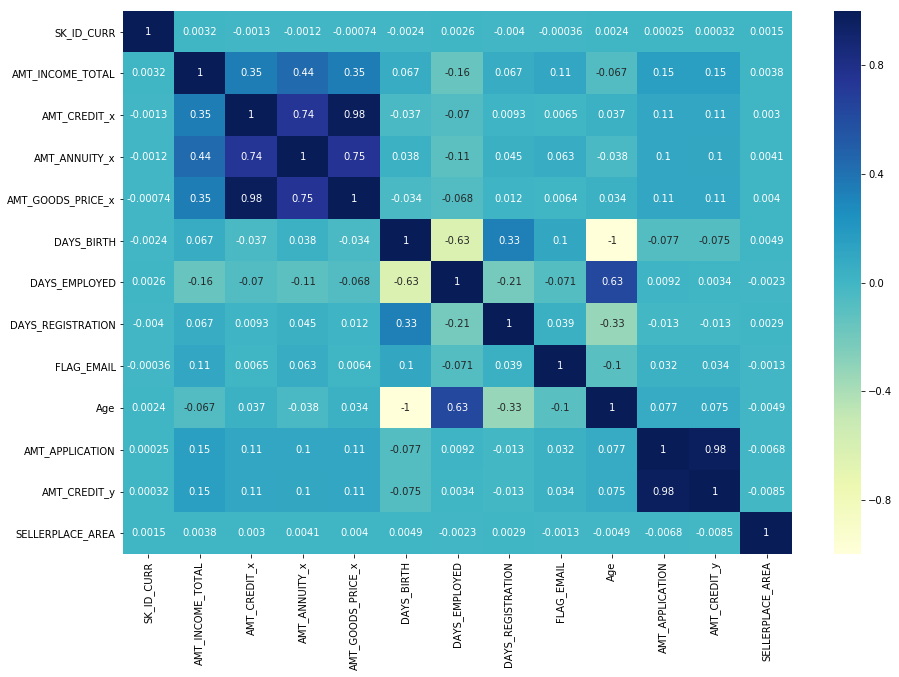

In [47]:
plt.figure(figsize=(15,10))
sns.heatmap(merged_df_Target_Zero_numeric.corr(), cmap="YlGnBu", annot=True)
plt.show()

So by above analysis for defaulters we can see that below columns are highly correlated.
1) AMT_CREDIT_x & AMT_GOODS_PRICE_x
2) AMT_APPLICATION & AMT_CREDIT_y
3) AMT_CREDIT_x & AMT_ANNUITY_x
4) AMT_GOODS_PRICE_x & AMT_ANNUITY_x 
5) AMT_INCOME_TOTAL & AMT_GOODS_PRICE_x

After this we will do univariate analysis for the numeric columns for both defaulter and non-defaulter clients and try to get insights from that.

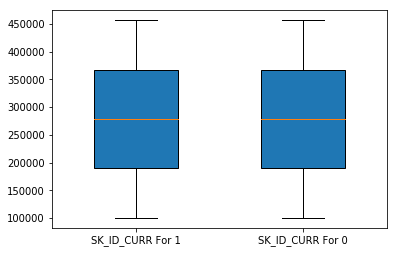

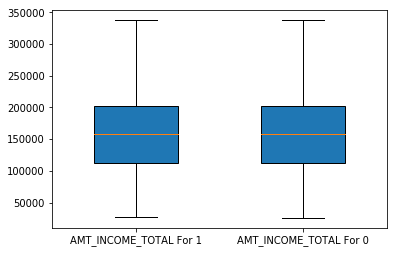

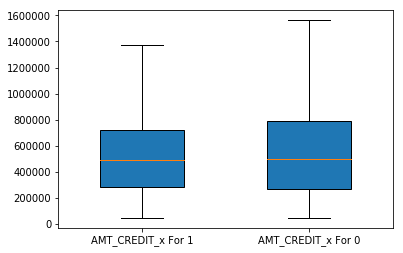

/Users/lifesight/anaconda3/lib/python3.7/site-packages/numpy/lib/function_base.py:3826: RuntimeWarning: Invalid value encountered in percentile
  interpolation=interpolation)
/Users/lifesight/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1246: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = np.compress(x <= hival, x)
/Users/lifesight/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1253: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = np.compress(x >= loval, x)
/Users/lifesight/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1261: RuntimeWarning: invalid value encountered in less
  np.compress(x < stats['whislo'], x),
/Users/lifesight/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1262: RuntimeWarning: invalid value encountered in greater
  np.compress(x > stats['whishi'], x)


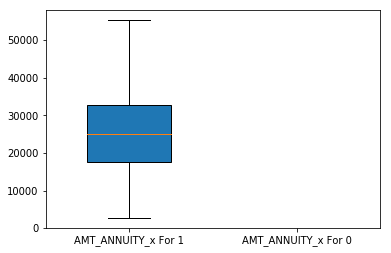

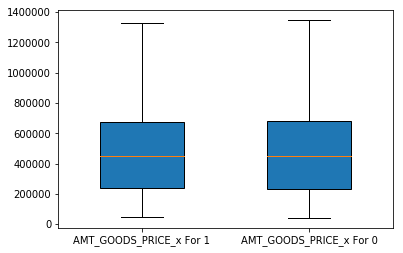

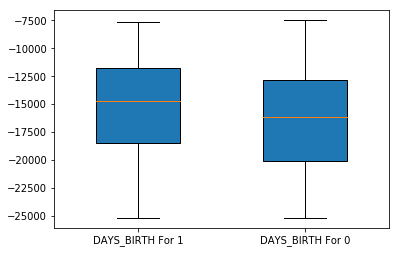

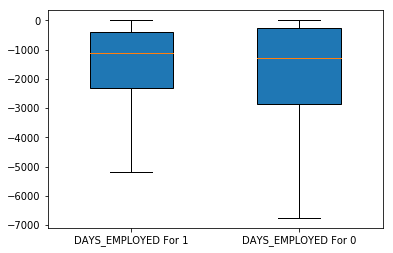

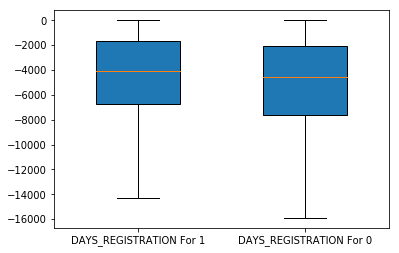

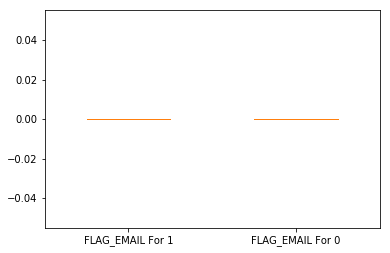

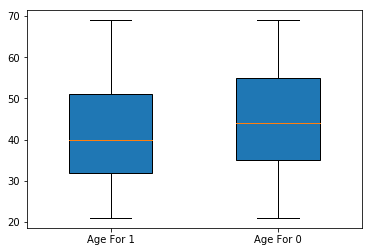

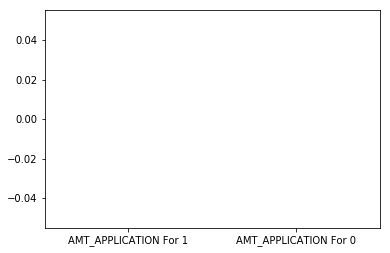

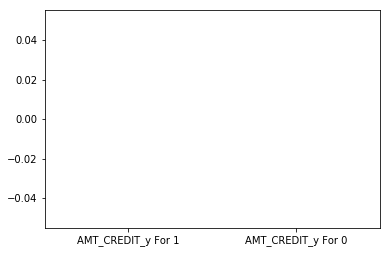

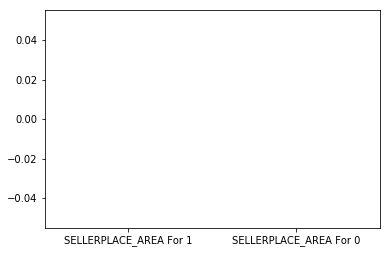

In [48]:
#Univariate analysis of numeric value
for col in merged_df_Target_One_numeric.columns:
    l1 = col + " For 1"
    l2 = col + " For 0"
    lables = [l1,l2]
    box_plot_data=[merged_df_Target_One_numeric[col],merged_df_Target_Zero_numeric[col]]
    plt.boxplot(box_plot_data,patch_artist=True,labels=lables, widths=0.5, showfliers=False)
    plt.show()

Now we analyse our categorical data, by linear plots or univariate analysis

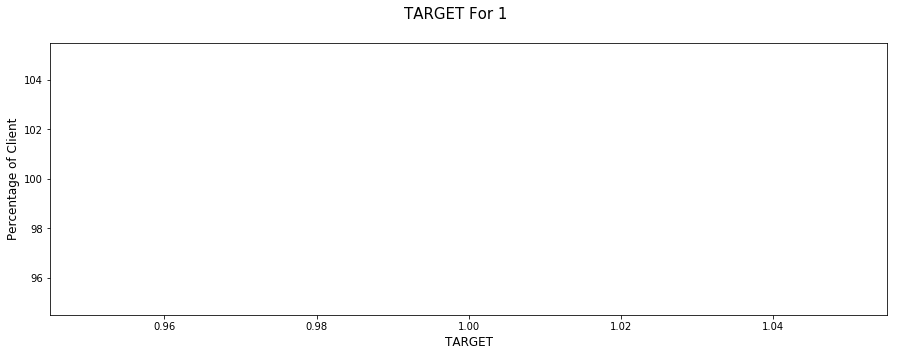

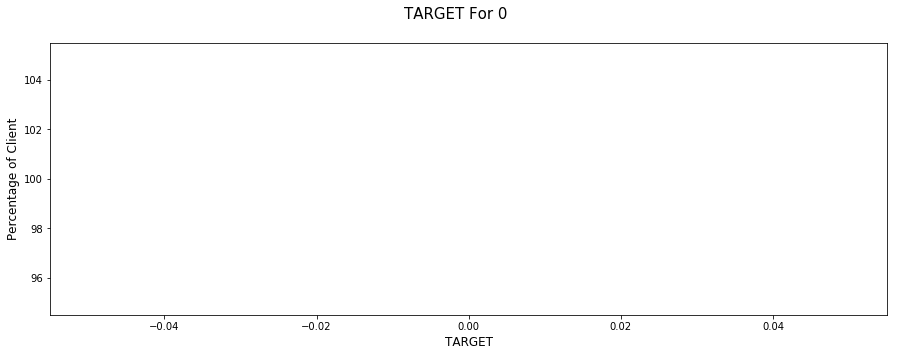

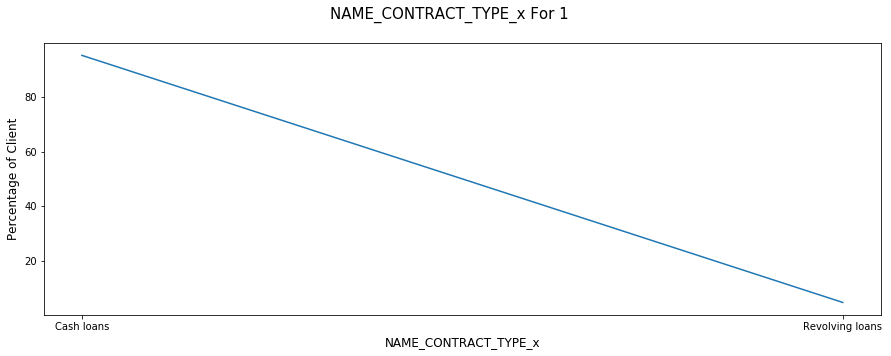

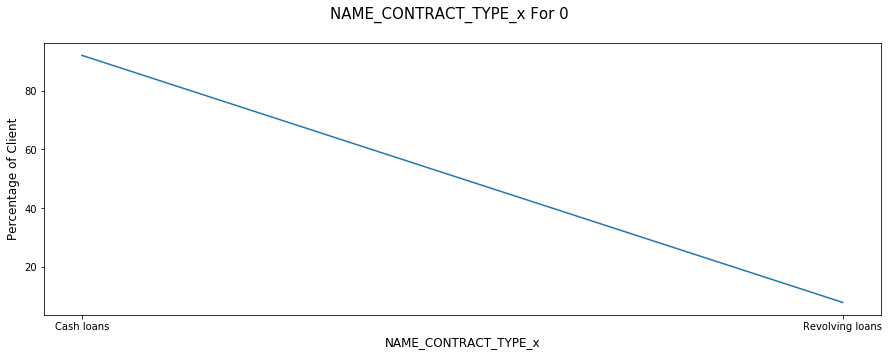

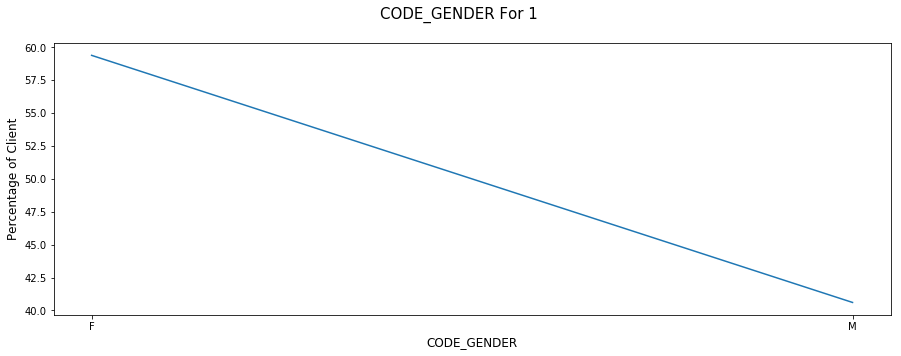

...

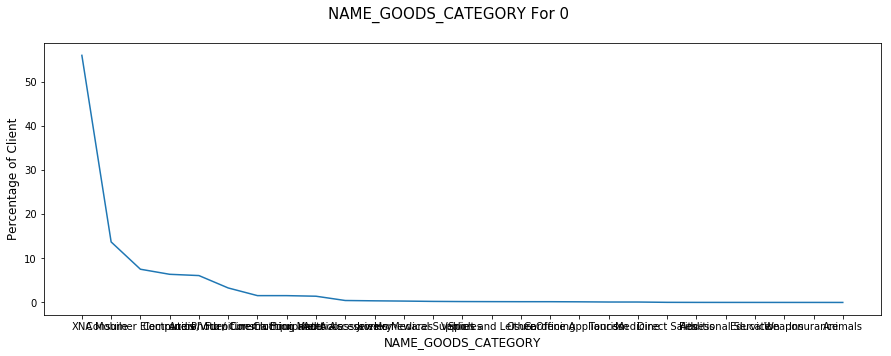

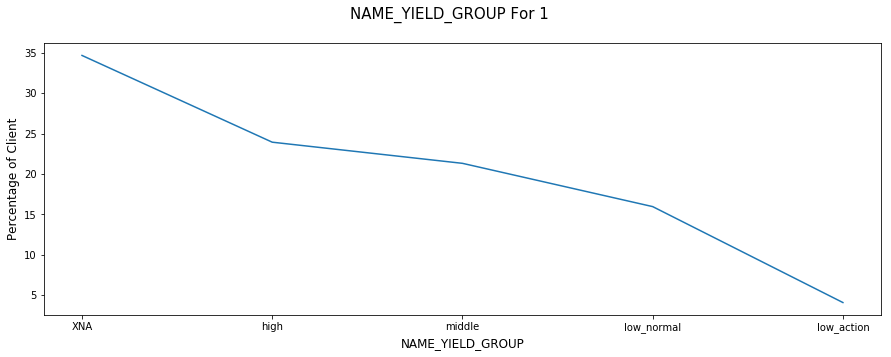

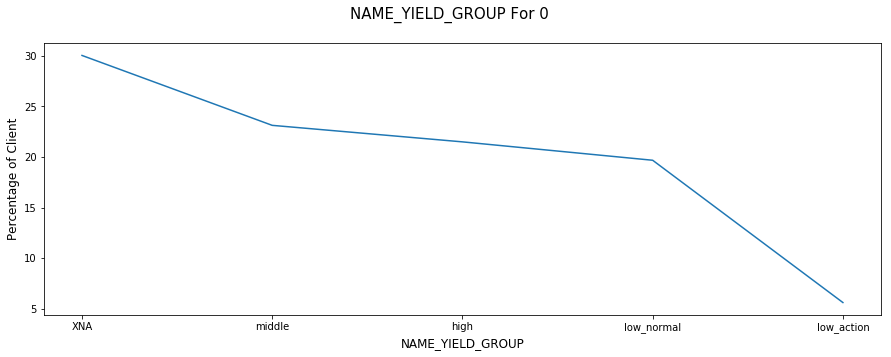

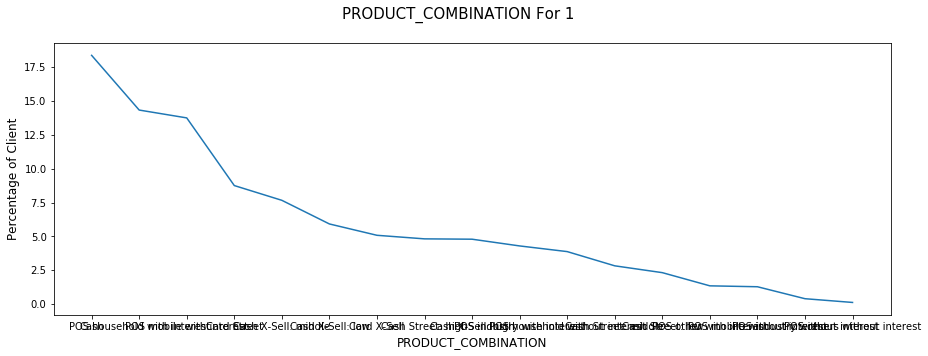

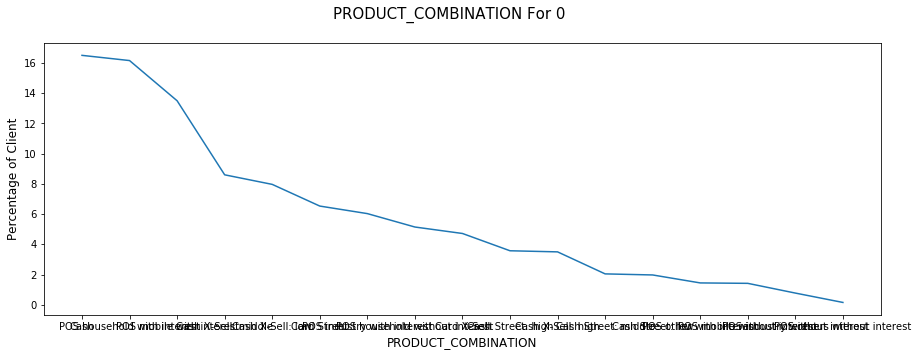

In [49]:
#Univariate analysis for categorical columns
for col in merged_df_Target_One_Non_numeric.columns:
    subtitle1 = col + " For 1"
    subtitle0 = col + " For 0"
    fig = plt.figure()
    fig.set_size_inches(15, 5)
    plt.plot(merged_df_Target_One_Non_numeric[col].value_counts(normalize=True)*100)
    fig.suptitle(subtitle1, fontsize=15)
    plt.xlabel(col, fontsize=12)
    plt.ylabel('Percentage of Client', fontsize=12)
    plt.show()

    fig = plt.figure()
    fig.set_size_inches(15, 5)
    plt.plot(merged_df_Target_Zero_Non_numeric[col].value_counts(normalize=True)*100)
    fig.suptitle(subtitle0, fontsize=15)
    plt.xlabel(col, fontsize=12)
    plt.ylabel('Percentage of Client', fontsize=12)
    plt.show()

So by above analysis we can see that